In [1]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn

import seaborn as sns
import os

from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import train_test_split 
from sklearn import linear_model, preprocessing 

In [2]:
dfg = pd.read_csv('Data.csv')
dfe = dfg[dfg['genre'] != 'Rap']
df = dfg[dfg['genre'] == 'Rap']

In [3]:
df.describe()

,Unnamed: 0,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,...,duration_ms_zscore,energy_zscore,instrumentalness_zscore,liveness_zscore,loudness_zscore,speechiness_zscore,tempo_zscore,valence_zscore,lognorm_duration_zscore,Count_zscore
count,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,...,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000,9232.000000
mean,93046.204831,60.533795,0.168080,0.697244,219853.858102,0.650520,0.009317,0.198939,-6.669916,0.188186,...,-0.143603,0.266919,-0.437662,-0.079703,0.451902,0.352960,0.119748,0.043554,-0.084772,-0.017341
std,13042.090536,8.177226,0.189780,0.141120,57890.478727,0.156686,0.065828,0.152349,2.450655,0.133128,...,0.496154,0.601306,0.225096,0.773436,0.412500,0.714730,0.962392,0.837573,0.687302,0.548304
min,68784.000000,14.000000,0.000007,0.179000,39640.000000,0.066800,0.000000,0.020800,-22.589000,0.022900,...,-1.688137,-1.973193,-0.469522,-0.984066,-2.227636,-0.534416,-2.537284,-1.611980,-4.460569,-0.617885
25%,96844.750000,55.000000,0.025700,0.604000,183790.000000,0.542000,0.000000,0.102750,-7.970750,0.070100,...,-0.452691,-0.149541,-0.469522,-0.568028,0.232943,-0.281012,-0.728063,-0.602179,-0.463292,-0.427754
50%,99152.500000,59.000000,0.096000,0.713000,214966.000000,0.649500,0.000000,0.135000,-6.347000,0.161000,...,-0.185495,0.263006,-0.469522,-0.404303,0.506256,0.207006,0.127031,0.004720,-0.054989,-0.159335
75%,101460.250000,65.000000,0.248250,0.802000,250687.000000,0.762000,0.000010,0.258000,-5.014750,0.279000,...,0.120654,0.694742,-0.469487,0.220136,0.730504,0.840516,0.800245,0.666435,0.345598,0.248887
max,103768.000000,99.000000,0.965000,0.980000,760973.000000,0.997000,0.951000,0.989000,0.496000,0.922000,...,4.494093,1.596590,2.782362,3.931232,1.658086,4.292610,3.213424,2.064260,3.239129,2.043944


In [4]:
cols = df.columns

allpop = dfe[dfe.popular == 'popular']
pop = df[df.popular == 'popular']
nonpop = df[df.popular == 'not-popular']


print(df.corr())


                         Unnamed: 0  popularity  acousticness  danceability  \
Unnamed: 0                 1.000000   -0.782580     -0.029408     -0.090576   
popularity                -0.782580    1.000000      0.008856      0.060827   
acousticness              -0.029408    0.008856      1.000000     -0.044776   
danceability              -0.090576    0.060827     -0.044776      1.000000   
duration_ms                0.009143   -0.018356     -0.035848     -0.150053   
energy                     0.100164   -0.041114     -0.314802     -0.251206   
instrumentalness           0.039919   -0.007325      0.071091     -0.047976   
liveness                   0.042990   -0.058562     -0.041794     -0.144971   
loudness                  -0.008949    0.068479     -0.283500     -0.109477   
speechiness               -0.002022   -0.081633      0.102392      0.066320   
tempo                     -0.022858    0.017122     -0.088897     -0.052913   
valence                    0.024061    0.000892     

AxesSubplot(0.125,0.125;0.62x0.755)


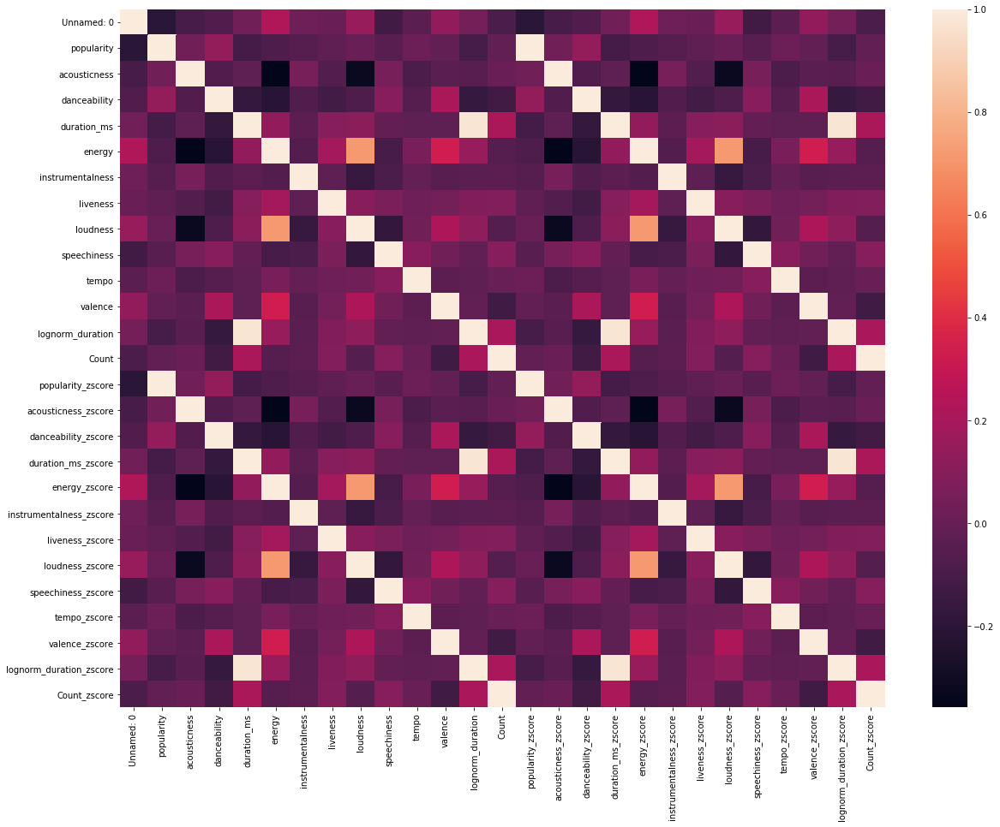

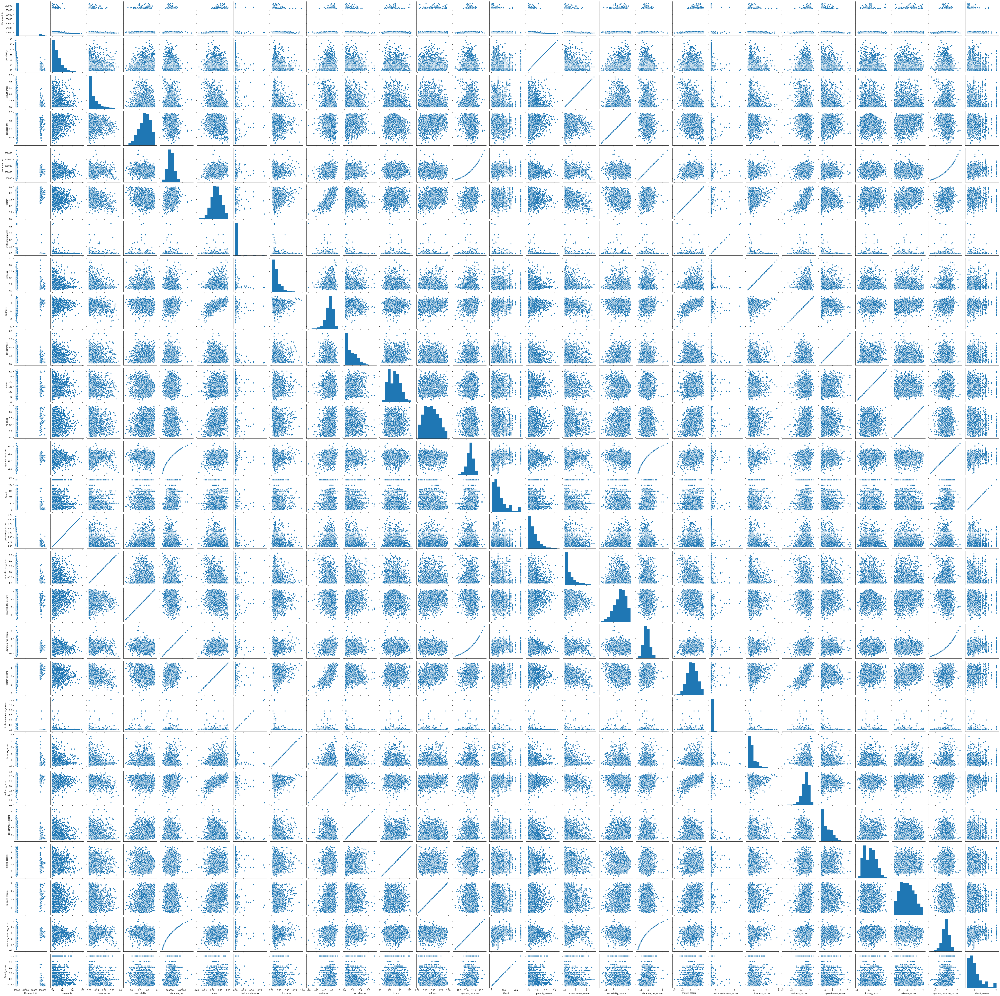

In [5]:
plt.subplots(figsize=(20,15))

m = sns.heatmap(pop.corr())
print(m)
n = sns.pairplot(data=pop)
print(n)


<ErrorbarContainer object of 3 artists>

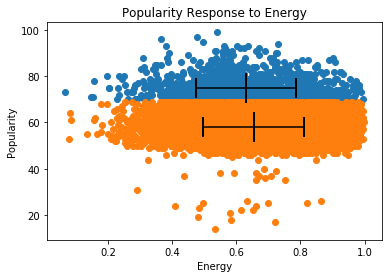

In [6]:
plt.scatter(pop.energy, pop.popularity)
plt.scatter(nonpop.energy, nonpop.popularity)
plt.xlabel("Energy")
plt.ylabel("Popularity")
plt.title("Popularity Response to Energy")

plt.errorbar(np.mean(pop.energy),np.mean(pop.popularity),xerr=np.std(pop.energy),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.energy),np.mean(nonpop.popularity),xerr=np.std(nonpop.energy),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

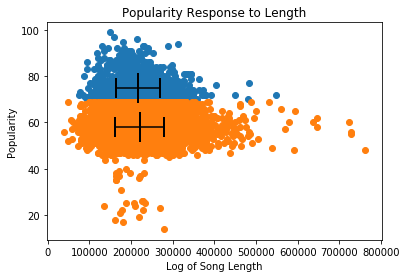

In [7]:
plt.scatter(pop.duration_ms, pop.popularity)
plt.scatter(nonpop.duration_ms, nonpop.popularity)
plt.xlabel("Log of Song Length")
plt.ylabel("Popularity")
plt.title("Popularity Response to Length")

plt.errorbar(np.mean(pop.duration_ms),np.mean(pop.popularity),xerr=np.std(pop.duration_ms),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.duration_ms),np.mean(nonpop.popularity),xerr=np.std(nonpop.duration_ms),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

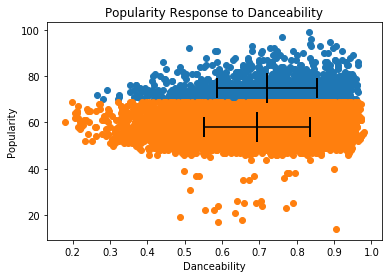

In [8]:
plt.scatter(pop.danceability, pop.popularity)
plt.scatter(nonpop.danceability, nonpop.popularity)
plt.xlabel("Danceability")
plt.ylabel("Popularity")
plt.title("Popularity Response to Danceability")

plt.errorbar(np.mean(pop.danceability),np.mean(pop.popularity),xerr=np.std(pop.danceability),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.danceability),np.mean(nonpop.popularity),xerr=np.std(nonpop.danceability),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

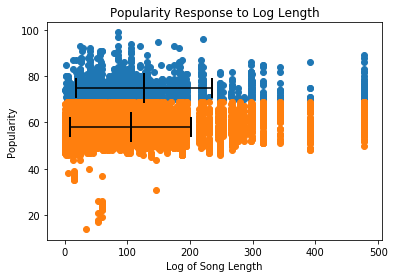

In [9]:
plt.scatter(pop.Count, pop.popularity)
plt.scatter(nonpop.Count, nonpop.popularity)
plt.xlabel("Log of Song Length")
plt.ylabel("Popularity")
plt.title("Popularity Response to Log Length")

plt.errorbar(np.mean(pop.Count),np.mean(pop.popularity),xerr=np.std(pop.Count),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.Count),np.mean(nonpop.popularity),xerr=np.std(nonpop.Count),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

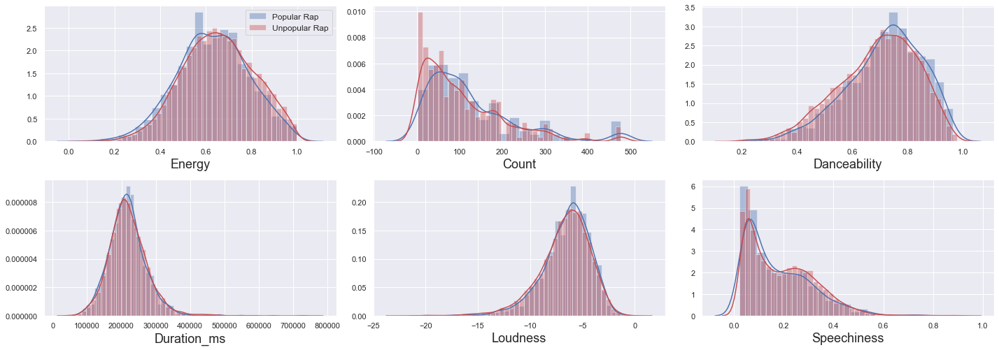

In [20]:
plt.figure(figsize=(20,10))
sns.set()
plt.subplot(331)
sns.distplot(pop.energy, label='Popular Rap')
sns.distplot(nonpop.energy, color='r', label='Unpopular Rap')
plt.xlabel('Energy', fontsize=18)
plt.legend(fontsize=12)

plt.subplot(332)
sns.distplot(pop.Count)
sns.distplot(nonpop.Count, color='r')
plt.xlabel('Count', fontsize=18)

plt.subplot(333)
sns.distplot(pop.danceability)
sns.distplot(nonpop.danceability, color='r')
plt.xlabel('Danceability', fontsize=18)

plt.subplot(334)
sns.distplot(pop.duration_ms)
sns.distplot(nonpop.duration_ms, color='r')
plt.xlabel('Duration_ms', fontsize=18)

plt.subplot(335)
sns.distplot(pop.loudness)
sns.distplot(nonpop.loudness, color='r')
plt.xlabel('Loudness', fontsize=18)

plt.subplot(336)
sns.distplot(pop.speechiness)
sns.distplot(nonpop.speechiness, color='r')
plt.xlabel('Speechiness', fontsize=18)

plt.tight_layout()
plt.show()


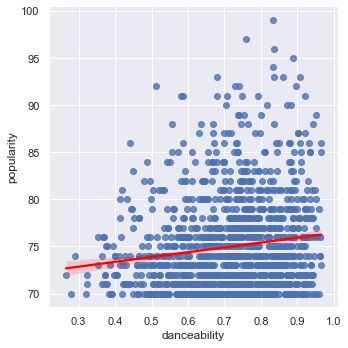

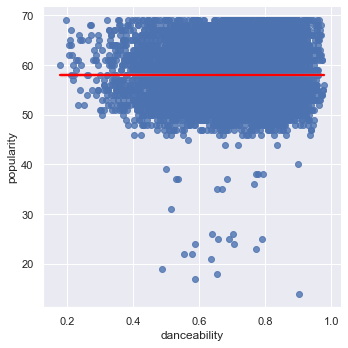

In [12]:
n = sns.lmplot(x='danceability',y='popularity',data=pop,line_kws={'color': 'red'})
print(n)
p = sns.lmplot(x='danceability',y='popularity',data=nonpop,line_kws={'color': 'red'})
print(p)


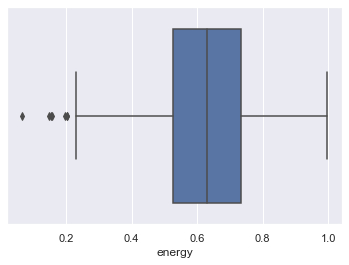

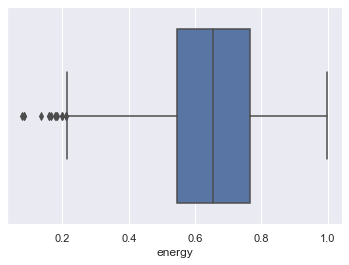

In [23]:
sns.boxplot(x='energy', data=pop, whis=1.5)
plt.show()

sns.boxplot(x='energy', data=nonpop, whis=1.5)
plt.show()

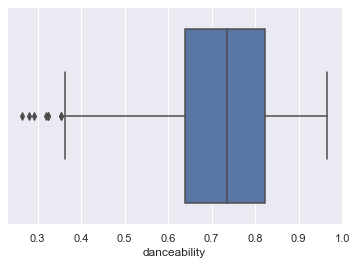

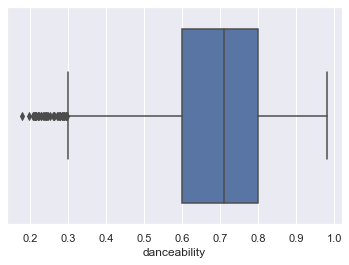

In [24]:
sns.boxplot(x='danceability', data=pop, whis=1.5)
plt.show()

sns.boxplot(x='danceability', data=nonpop, whis=1.5)
plt.show()

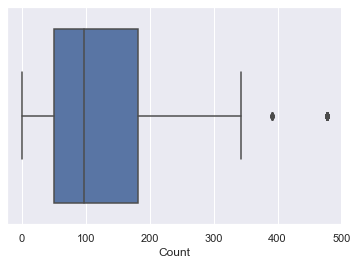

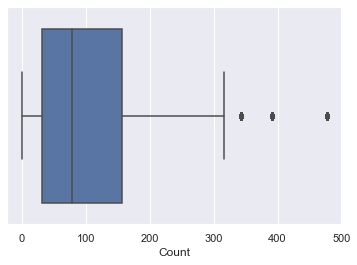

In [25]:
sns.boxplot(x='Count', data=pop, whis=1.5)
plt.show()

sns.boxplot(x='Count', data=nonpop, whis=1.5)
plt.show()

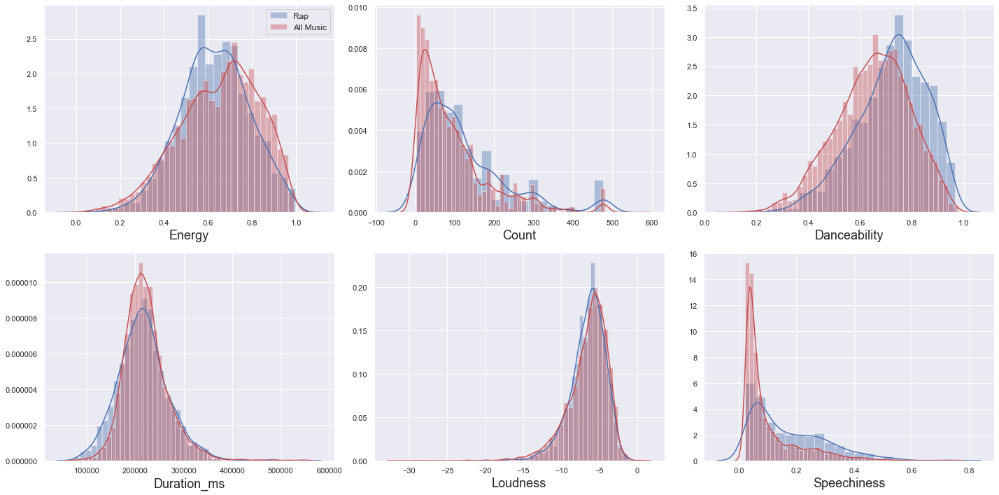

In [21]:
plt.figure(figsize=(20,10))
sns.set()
plt.subplot(231)
sns.distplot(pop.energy, label='Rap')
sns.distplot(allpop.energy, color='r', label='All Music')
plt.xlabel('Energy', fontsize=18)
plt.legend(fontsize=12)

plt.subplot(232)
sns.distplot(pop.Count)
sns.distplot(allpop.Count, color='r')
plt.xlabel('Count', fontsize=18)

plt.subplot(233)
sns.distplot(pop.danceability)
sns.distplot(allpop.danceability, color='r')
plt.xlabel('Danceability', fontsize=18)

plt.subplot(234)
sns.distplot(pop.duration_ms)
sns.distplot(allpop.duration_ms, color='r')
plt.xlabel('Duration_ms', fontsize=18)

plt.subplot(235)
sns.distplot(pop.loudness)
sns.distplot(allpop.loudness, color='r')
plt.xlabel('Loudness', fontsize=18)

plt.subplot(236)
sns.distplot(pop.speechiness)
sns.distplot(allpop.speechiness, color='r')
plt.xlabel('Speechiness', fontsize=18)



plt.tight_layout()
plt.show()


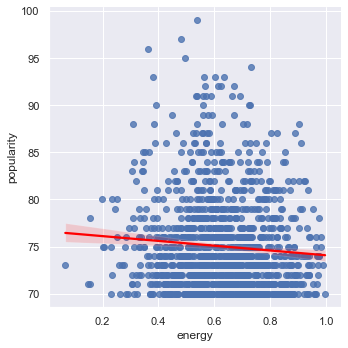

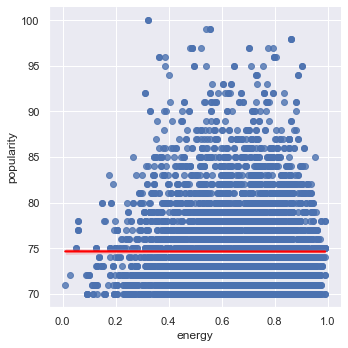

In [17]:
n = sns.lmplot(x='energy',y='popularity',data=pop,line_kws={'color': 'red'})
print(n)
p = sns.lmplot(x='energy',y='popularity',data=allpop,line_kws={'color': 'red'})
print(p)